In [ ]:
from google.colab import drive 
drive.mount('/content/gdrive')

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


In [ ]:
!pip install gensim==4.1.2

     |████████████████████████████████| 24.1 MB 65.9 MB/s 
  Attempting uninstall: gensim
    Found existing installation: gensim 3.6.0
    Uninstalling gensim-3.6.0:
      Successfully uninstalled gensim-3.6.0


In [ ]:
from tqdm import tqdm

import nltk
from nltk.corpus import stopwords
from nltk import word_tokenize
from nltk.stem import WordNetLemmatizer

from collections import Counter
import re
import time

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns


import gensim
import gensim.downloader as api

from scipy.sparse import hstack
from scipy.stats import describe

from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from sklearn.linear_model import LogisticRegression, LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.svm import LinearSVR, NuSVR, SVR
from sklearn.metrics import mean_squared_error
from sklearn.ensemble import (
    RandomForestRegressor,
    GradientBoostingRegressor,
    AdaBoostRegressor,
)

import xgboost as xgb

from sklearn.metrics import mean_squared_error

In [ ]:
nltk.download('punkt')

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.


True

In [ ]:
import warnings
warnings.filterwarnings("ignore")

In [ ]:
sns.set()

## Store Train Data, Dev and Test Data into dataframes

In [ ]:
#Train data
train_df = pd.read_csv("gdrive/My Drive/dataset/train.csv", dtype=str)
#Validation data
dev_df = pd.read_csv("gdrive/My Drive/dataset/dev.csv", dtype=str)
#Test data
test_df = pd.read_csv("gdrive/My Drive/dataset/truth_task_1.csv", dtype=str)
test_df.head()

,id,original,edit,grades,meanGrade
0,36,The Latest : Election tally shows <Austria/> t...,Cars,31110,1.2
1,2157,House Intel <Republicans/> Have Cleared Trump ...,onions,11000,0.4
2,9385,Christmas Is Canceled : Nazareth ’s Muslim <Ma...,grump,11111,1.0
3,14434,White House says Trump 's legal <team/> suppor...,bozos,32210,1.6
4,9462,Election <analysts/> move Ryan seat toward Dem...,movers,11000,0.4


## Function to RMSE Evaluation Criteria

In [ ]:
def rmse(y_true, y_pred):
    return np.sqrt(mean_squared_error(y_true, y_pred))

## Competion Baseline is to atleast predict each value as avg. of all meanGrades in training data, which is done in the following cell

In [ ]:
y_train = train_df["meanGrade"].astype(float)
y_dev = dev_df["meanGrade"].astype(float)

In [ ]:
y_train

0       0.2
1       1.6
2       1.0
3       0.4
4       0.0
       ... 
9647    0.0
9648    0.4
9649    0.6
9650    1.4
9651    0.4
Name: meanGrade, Length: 9652, dtype: float64

In [ ]:
y_dev

0       1.0
1       0.8
2       0.6
3       1.6
4       0.4
       ... 
2414    0.2
2415    3.0
2416    1.4
2417    1.4
2418    0.6
Name: meanGrade, Length: 2419, dtype: float64

In [ ]:
y_test = test_df["meanGrade"].astype(float)
y_test

0       1.2
1       0.4
2       1.0
3       1.6
4       0.4
       ... 
3019    1.8
3020    0.6
3021    0.4
3022    0.0
3023    0.8
Name: meanGrade, Length: 3024, dtype: float64

In [ ]:
y_train_int = y_train.astype(float) * 10
y_train_int = y_train_int.astype(int)

In [ ]:
meanGrade = np.mean(y_train)
meanGrade

0.9355712114932938

Now we are finding RMSE for this baseline model

In [ ]:
[meanGrade] * len(y_test)

[0.9355712114932938,
 0.9355712114932938,
 0.9355712114932938,
 0.9355712114932938,
 0.9355712114932938,
 0.9355712114932938,
 0.9355712114932938,
 0.9355712114932938,
 0.9355712114932938,
 0.9355712114932938,
 0.9355712114932938,
 0.9355712114932938,
 0.9355712114932938,
 0.9355712114932938,
 0.9355712114932938,
 0.9355712114932938,
 0.9355712114932938,
 0.9355712114932938,
 0.9355712114932938,
 0.9355712114932938,
 0.9355712114932938,
 0.9355712114932938,
 0.9355712114932938,
 0.9355712114932938,
 0.9355712114932938,
 0.9355712114932938,
 0.9355712114932938,
 0.9355712114932938,
 0.9355712114932938,
 0.9355712114932938,
 0.9355712114932938,
 0.9355712114932938,
 0.9355712114932938,
 0.9355712114932938,
 0.9355712114932938,
 0.9355712114932938,
 0.9355712114932938,
 0.9355712114932938,
 0.9355712114932938,
 0.9355712114932938,
 0.9355712114932938,
 0.9355712114932938,
 0.9355712114932938,
 0.9355712114932938,
 0.9355712114932938,
 0.9355712114932938,
 0.9355712114932938,
 0.9355712114

In [ ]:
baseline_rmse = rmse(y_test,[meanGrade] * len(y_test))
baseline_rmse

0.5747096554442188

## Data Preprocessing

In [ ]:
train_df.shape

(9652, 5)

In [ ]:
dev_df.shape

(2419, 5)

In [ ]:
test_df.shape

(3024, 5)

**We are first removing < and /> from original headline to create a new headline using the edited word given in the dataset**

In [ ]:
train_df['original']

0       France is ‘ hunting down its citizens who join...
1       Pentagon claims 2,000 % increase in Russian tr...
2       Iceland PM Calls Snap Vote as Pedophile Furor ...
3       In an apparent first , Iran and Israel <engage...
4       Trump was told weeks ago that Flynn misled <Vi...
                              ...                        
9647    State officials blast ' unprecedented ' DHS <m...
9648    Protesters Rally for <Refugees/> Detained at J...
9649    Cruise line Carnival Corp. joins the fight aga...
9650    Columbia police hunt woman seen with <gun/> ne...
9651    Here 's What 's In The House-Approved Health <...
Name: original, Length: 9652, dtype: object

In [ ]:
train_df['edit']

0              twins
1            bowling
2              party
3               slap
4             school
            ...     
9647            idea
9648    stewardesses
9649          raisin
9650            cake
9651            food
Name: edit, Length: 9652, dtype: object

In [ ]:
train_df["new"] = train_df.apply(
    lambda x: re.sub(r"<.+/>", x["edit"], x["original"]), axis=1
)
#Reference: https://stackoverflow.com/questions/14007545/python-regex-instantly-replace-groups
train_df["original"] = train_df["original"].str.replace(r"<(.+)/>", "\g<1>")

dev_df["new"] = dev_df.apply(
    lambda x: re.sub(r"<.+/>", x["edit"], x["original"]), axis=1
)
dev_df["original"] = dev_df["original"].str.replace(r"<(.+)/>", "\g<1>")

test_df["new"] = test_df.apply(
    lambda x: re.sub(r"<.+/>", x["edit"], x["original"]), axis=1
)
test_df["original"] = test_df["original"].str.replace(r"<(.+)/>", "\g<1>")

In [ ]:
train_df['original']

0       France is ‘ hunting down its citizens who join...
1       Pentagon claims 2,000 % increase in Russian tr...
2       Iceland PM Calls Snap Vote as Pedophile Furor ...
3       In an apparent first , Iran and Israel engage ...
4       Trump was told weeks ago that Flynn misled Vic...
                              ...                        
9647    State officials blast ' unprecedented ' DHS mo...
9648    Protesters Rally for Refugees Detained at JFK ...
9649    Cruise line Carnival Corp. joins the fight aga...
9650    Columbia police hunt woman seen with gun near ...
9651    Here 's What 's In The House-Approved Health C...
Name: original, Length: 9652, dtype: object

In [ ]:
train_df['new']

0       France is ‘ hunting down its citizens who join...
1       Pentagon claims 2,000 % increase in Russian tr...
2       Iceland PM Calls Snap Vote as Pedophile Furor ...
3       In an apparent first , Iran and Israel slap ea...
4       Trump was told weeks ago that Flynn misled sch...
                              ...                        
9647    State officials blast ' unprecedented ' DHS id...
9648    Protesters Rally for stewardesses Detained at ...
9649    Cruise line Carnival Corp. joins the fight aga...
9650    Columbia police hunt woman seen with cake near...
9651    Here 's What 's In The House-Approved Health f...
Name: new, Length: 9652, dtype: object

In [ ]:
dev_df['original']

0       Thousands of gay and bisexual men convicted of...
1            Special prosecutor appointed to Trump Russia
2       Spanish police detain man and search Ripoll ad...
3       N.Y. Times reprimands reporter for sharing ' u...
4       Vladimir Putin Releases Video Simulation Of Ru...
                              ...                        
2414    Supreme Court Once Again Strikes Down Racial G...
2415    Trump Mocks Schumer ’s Tears ; Vows to ‘ Make ...
2416    US government memo on the danger of leaking to...
2417    Newt Gingrich : Join Me in Supporting Judge Ro...
2418       In Search of Donald Trump at His Boyhood Home 
Name: original, Length: 2419, dtype: object

In [ ]:
dev_df['new']

0       Thousands of gay and bisexual swans convicted ...
1                  Special chef appointed to Trump Russia
2       Spanish police detain man and search Ripoll ad...
3       N.Y. Times applauds reporter for sharing ' unf...
4       Vladimir Putin Releases Video Simulation Of Ru...
                              ...                        
2414    Supreme leaders Once Again Strikes Down Racial...
2415    Trump Mocks Schumer ’s Tears ; Vows to ‘ Make ...
2416    US government memo on the amusement of leaking...
2417    Newt Gingrich : Join Me in Supporting Judge Ro...
2418     In Search of Donald Trump at His Boyhood Castle 
Name: new, Length: 2419, dtype: object

In [ ]:
test_df['original']

0       The Latest : Election tally shows Austria turn...
1       House Intel Republicans Have Cleared Trump . S...
2       Christmas Is Canceled : Nazareth ’s Muslim May...
3       White House says Trump 's legal team supports ...
4       Election analysts move Ryan seat toward Dems a...
                              ...                        
3019    Sen. Bernie Sanders says he ’s “ sickened ” by...
3020    Trump Repeals Regulation Protecting Workers Fr...
3021    Spicer : We do n't regret repeating claim that...
3022    Gunshots Fired Outside Houses of Parliament in...
3023    Flynn has promised Special Counsel ' full coop...
Name: original, Length: 3024, dtype: object

In [ ]:
test_df['new']

0       The Latest : Election tally shows Cars turning...
1       House Intel onions Have Cleared Trump . So Are...
2       Christmas Is Canceled : Nazareth ’s Muslim gru...
3       White House says Trump 's legal bozos supports...
4       Election movers move Ryan seat toward Dems aft...
                              ...                        
3019    Sen. Bernie Sanders says he ’s “ sickened ” by...
3020    Trump Repeals Regulation Protecting Owners Fro...
3021    Spicer : We do n't regret repeating claim that...
3022      Gunshots Fired Outside Houses of dogs in London
3023    Flynn has promised Special Counsel ' full mont...
Name: new, Length: 3024, dtype: object

**Next, we will do pre-processing to removal of stop words, special characters. We will also do expansion of all the contractions present in text**

In [ ]:
nltk.download("stopwords")

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


True

In [ ]:
stop_words = set(stopwords.words("english"))

In [ ]:
sent_0_original = train_df['original'].values[0]
print(sent_0_original)
sent_0_new = train_df['new'].values[0]
print(sent_0_new)
print("="*50)
sent_1000_original = train_df['original'].values[1000]
print(sent_1000_original)
sent_1000_new = train_df['new'].values[1000]
print(sent_1000_new)
print("="*50)

France is ‘ hunting down its citizens who joined Isis ’ without trial in Iraq
France is ‘ hunting down its citizens who joined twins ’ without trial in Iraq
Mike Pence Told About Flynn Warning Two Weeks After Trump , White House
Mike Pence Told About Flynn odor Two Weeks After Trump , White House


In [ ]:
#Reference: https://stackoverflow.com/a/5843547/4084039
sent_0 = re.sub('[^A-Za-z0-9]+', ' ', sent_0_original)
print(sent_0)

France is hunting down its citizens who joined Isis without trial in Iraq


In [ ]:
def decontracted(phrase):
    phrase = re.sub(r"won't", "will not", phrase)
    phrase = re.sub(r"can\'t", "can not", phrase)
    phrase = re.sub(r"n\'t", " not", phrase)
    phrase = re.sub(r"\'re", " are", phrase)
    phrase = re.sub(r"\'s", " is", phrase)
    phrase = re.sub(r"\'d", " would", phrase)
    phrase = re.sub(r"\'ll", " will", phrase)
    phrase = re.sub(r"\'t", " not", phrase)
    phrase = re.sub(r"\'ve", " have", phrase)
    phrase = re.sub(r"\'m", " am", phrase)
    return phrase

# Reference: https://stackoverflow.com/a/47091490/4084039

In [ ]:
def preprocess(df, column):
    
    preprocessed_sentences =[]
    for sentence in tqdm(df[column].values):
        sentence = decontracted(sentence)
        sentence = re.sub('[^A-Za-z]+', ' ', sentence)
        sentence = ' '.join(e.lower() for e in sentence.split() if e.lower() not in stop_words)
        preprocessed_sentences.append(sentence.strip())
    return preprocessed_sentences

In [ ]:
print(train_df['original'].head())

0    France is ‘ hunting down its citizens who join...
1    Pentagon claims 2,000 % increase in Russian tr...
2    Iceland PM Calls Snap Vote as Pedophile Furor ...
3    In an apparent first , Iran and Israel engage ...
4    Trump was told weeks ago that Flynn misled Vic...
Name: original, dtype: object


In [ ]:
train_df['original']= preprocess(train_df,'original')
train_df['original'].head()

100%|██████████| 9652/9652 [00:00<00:00, 39078.62it/s]


0    france hunting citizens joined isis without tr...
1    pentagon claims increase russian trolls syria ...
2    iceland pm calls snap vote pedophile furor cra...
3         apparent first iran israel engage militarily
4     trump told weeks ago flynn misled vice president
Name: original, dtype: object

In [ ]:
train_df['new']= preprocess(train_df,'new')
train_df['new'].head()

100%|██████████| 9652/9652 [00:00<00:00, 41152.65it/s]


0    france hunting citizens joined twins without t...
1    pentagon claims increase russian trolls bowlin...
2    iceland pm calls snap vote pedophile furor cra...
3           apparent first iran israel slap militarily
4    trump told weeks ago flynn misled school presi...
Name: new, dtype: object

In [ ]:
dev_df['original']= preprocess(dev_df,'original')
dev_df['new']= preprocess(dev_df,'new')
dev_df['new'].head()

100%|██████████| 2419/2419 [00:00<00:00, 39221.98it/s]


0    thousands gay bisexual swans convicted long ab...
1                  special chef appointed trump russia
2    spanish police detain man search ripoll addres...
3    n times applauds reporter sharing unfounded ru...
4    vladimir putin releases video simulation russi...
Name: new, dtype: object

In [ ]:
test_df['original']= preprocess(test_df,'original')
test_df['new']= preprocess(test_df,'new')
test_df['new'].head()

100%|██████████| 3024/3024 [00:00<00:00, 36889.84it/s]


0       latest election tally shows cars turning right
1    house intel onions cleared trump russia invest...
2    christmas canceled nazareth muslim grump bans ...
3    white house says trump legal bozos supports se...
4    election movers move ryan seat toward dems ret...
Name: new, dtype: object

## Now we do featurization of textual Sentences into Numeric Vectors using Word2Vec method

## 3.c) Word2Vec on both original and edited headlines

**NOTE:**

Running this full code would take about 2GB of memory and atleast 30 minutes for execution. 


In [ ]:
model = api.load("word2vec-google-news-300")

[==================================================] 100.0% 1662.8/1662.8MB downloaded


In [ ]:
def document_vector(word2vec_model, doc):
    words = list(model.index_to_key)
    doc = [word for word in doc if word in words]
    return np.mean(model[doc], axis=0)

def preprocess(text):
    doc = word_tokenize(text.lower())
    doc = [word for word in doc if word not in stop_words]
    doc = [word for word in doc if word.isalpha()]
    return doc

def to_vector(df, column):
    headlines = df[column].tolist()
    corpus = [preprocess(title) for title in headlines]
    X = []
    for doc in corpus:  
        vector = document_vector(model, doc)
        X.append(vector)
    return np.array(X)

In [ ]:
to_vector(train_df.sample(10), "original")

array([[-0.08576448,  0.17818777,  0.05490003, ..., -0.03173828,
         0.04722377, -0.09915597],
       [ 0.0208469 ,  0.02444119, -0.04562717, ...,  0.00141737,
         0.0293986 ,  0.16625977],
       [ 0.08166504, -0.02706909,  0.04248047, ..., -0.05305989,
        -0.1044515 ,  0.10253906],
       ...,
       [-0.07924107,  0.04039655,  0.10452706, ...,  0.0418178 ,
         0.03142438,  0.10435268],
       [-0.13989258,  0.08099365,  0.1373291 , ...,  0.05317307,
         0.06312561, -0.1494751 ],
       [-0.10103353, -0.00076803,  0.00660197, ..., -0.11116537,
        -0.01331584,  0.08703613]], dtype=float32)

In [ ]:
X_train_orig = to_vector(train_df, "original")
X_train_new = to_vector(train_df, "new")
X_dev_orig = to_vector(dev_df, "original")
X_dev_new = to_vector(dev_df, "new")


In [ ]:
X_test_orig = to_vector(test_df, "original")
X_test_new = to_vector(test_df, "new")


In [ ]:
X_train = [
    np.concatenate((X_train_orig[c], X_train_new[c]), axis=None)
    for c in range(len(X_train_orig))
]
X_dev = [
    np.concatenate((X_dev_orig[c], X_dev_new[c]), axis=None)
    for c in range(len(X_dev_orig))
]

In [ ]:
X_test = [
    np.concatenate((X_test_orig[c], X_test_new[c]), axis=None)
    for c in range(len(X_test_orig))
]

In [ ]:
X_train

[array([ 5.34057617e-03,  5.68084717e-02, -2.97813416e-02,  1.03919983e-01,
        -7.24878311e-02,  1.04560852e-02, -4.01878357e-02, -1.32568359e-01,
         5.00488281e-03,  7.69996643e-02,  6.98852539e-02, -1.01490021e-01,
        -1.43508911e-01, -2.46868134e-02, -4.94079590e-02,  1.06979370e-01,
         9.13696289e-02,  6.91833496e-02, -3.79333496e-02, -4.78935242e-02,
        -6.71386719e-04, -6.38122559e-02,  6.03027344e-02,  1.10092163e-02,
        -9.31777954e-02, -2.22873688e-02, -8.86440277e-02,  4.71878052e-02,
         3.55834961e-02, -1.95159912e-02,  5.09357452e-02,  1.86386108e-02,
        -8.54339600e-02,  1.10931396e-02, -8.95080566e-02,  4.19063568e-02,
        -2.84469128e-02, -5.50079346e-03,  1.23733521e-01,  4.66156006e-02,
         3.96270752e-02,  1.59454346e-02,  1.68640137e-01,  6.04248047e-03,
         2.40936279e-02, -5.64800501e-02,  6.82067871e-03,  2.54516602e-02,
        -5.18798828e-02,  1.38010025e-01, -4.10385132e-02, -1.14318848e-01,
         4.9

In [ ]:
len(X_train) #no of rows

9652

In [ ]:
len(X_train[0]) #no of features

600

In [ ]:
len(X_test) #no of rows

3024

In [ ]:
len(X_train[0]) #no of features

600

In [ ]:
X_train_df = pd.DataFrame(X_train)
X_train_df.to_csv('X_train_word2vec.csv', index=False, header=False)

In [ ]:
X_dev_df = pd.DataFrame(X_dev)
X_dev_df.to_csv('X_dev_word2vec.csv', index=False, header=False)

In [ ]:
X_test_df = pd.DataFrame(X_test)
X_test_df.to_csv('X_test_word2vec.csv', index=False, header=False)

## Model Building

In [ ]:
def roundPred(predictions):
    final_predictions = []
    for val in predictions:
        val = int(val * 10)
        final_predictions.append(val / 10)
    return final_predictions

In [ ]:
model_results = {}

In [ ]:
model_results["BASELINE"] = baseline_rmse

### a) Linear Regression

In [ ]:
lin_reg = LinearRegression()
lin_reg.fit(X_train, y_train)

LinearRegression()

In [ ]:
predictions = roundPred(lin_reg.predict(X_dev))

In [ ]:
lin_reg_rmse = rmse(y_dev, predictions)

In [ ]:
lin_reg_rmse

0.5539851489585611

In [ ]:
predictions = roundPred(lin_reg.predict(X_test))

In [ ]:
lin_reg_rmse = rmse(y_test, predictions)

In [ ]:
lin_reg_rmse

0.5674859856554555

In [ ]:
model_results["Linear Regression"] = lin_reg_rmse

### b) Random Forest Regressor

In [ ]:
rf_reg = RandomForestRegressor(n_estimators=10, n_jobs=-1, verbose=1, random_state=42)
rf_reg.fit(X_train, y_train)

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   6 out of  10 | elapsed:    4.9s remaining:    3.3s
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    7.8s finished


RandomForestRegressor(n_estimators=10, n_jobs=-1, random_state=42, verbose=1)

In [ ]:
predictions = roundPred(rf_reg.predict(X_dev))

[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done   6 out of  10 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=8)]: Done  10 out of  10 | elapsed:    0.0s finished


In [ ]:
rf_rmse = rmse(y_dev, predictions)

In [ ]:
rf_rmse

0.5987619858237756

In [ ]:
predictions = roundPred(rf_reg.predict(X_test))

[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done   6 out of  10 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=8)]: Done  10 out of  10 | elapsed:    0.0s finished


In [ ]:
rf_rmse = rmse(y_test, predictions)
rf_rmse

0.5955384163015895

In [ ]:
model_results["Random Forest"] = rf_rmse

We will now try to do some hyperparameter tuning on Random Forest

In [ ]:
results_rf_optimize = {}

In [ ]:
time_dict = {}

In [ ]:
for n in range(10, 201, 20):
    start = time.time()
    rf_reg = RandomForestRegressor(n_estimators=n, random_state=42, n_jobs=-1)
    rf_reg.fit(X_train, y_train)
    predictions = roundPred(rf_reg.predict(X_dev))
    rf_rmse = rmse(dev_df["meanGrade"], predictions)
    results_rf_optimize[n] = rf_rmse
    end = time.time()
    time_dict[n]= start-end
    print(f"N: {n} --> {rf_rmse:.5f}")

N: 10 --> 0.59883
N: 30 --> 0.57895
N: 50 --> 0.57510
N: 70 --> 0.57436
N: 90 --> 0.57277
N: 110 --> 0.57254
N: 130 --> 0.57205
N: 150 --> 0.57212
N: 170 --> 0.57244
N: 190 --> 0.57149


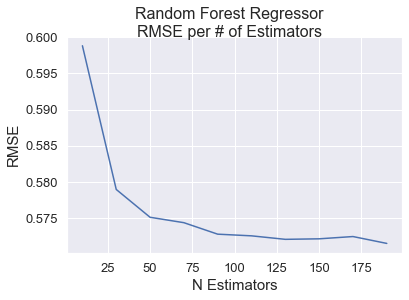

In [ ]:
results_df = (
    pd.DataFrame(results_rf_optimize.items(), columns=["n_estimators", "RMSE"])
    .sort_values("n_estimators")
    .reset_index(drop=True)
)
ax = sns.lineplot(x="n_estimators", y="RMSE", data=results_df, color="b")
plt.suptitle("Random Forest Regressor\nRMSE per # of Estimators", fontsize=16)
ax.set_xlabel("N Estimators", fontsize=15)
ax.set_ylabel("RMSE", fontsize=15)
ax.xaxis.set_tick_params(labelsize=13)
ax.yaxis.set_tick_params(labelsize=13)

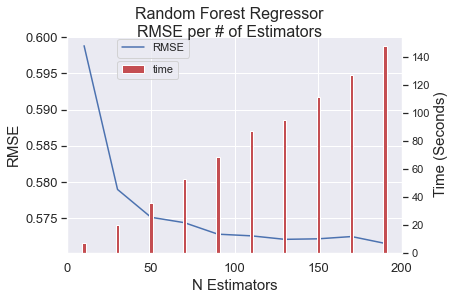

In [ ]:
time_df = (
    pd.DataFrame(time_dict.items(), columns=["n_estimators", "time"])
    .sort_values("time")
    .reset_index(drop=True)
)
time_df["time"] = time_df["time"].apply(lambda x: abs(x))

fig = plt.figure()
ax1 = fig.add_subplot(111)
ln1 = ax1.plot(results_df["n_estimators"], results_df["RMSE"], color='b', label="RMSE")
ax2 = ax1.twinx()
ln2 = ax2.bar(time_df["n_estimators"], time_df["time"], color='r', width = 2, label="time")
ax2.grid(False)
plt.suptitle("Random Forest Regressor\nRMSE per # of Estimators", fontsize=16)
ax1.set_xlabel("N Estimators", fontsize=15)
ax1.set_ylabel("RMSE", fontsize=15)
ax2.set_ylabel("Time (Seconds)", fontsize=15)
ax1.xaxis.set_tick_params(labelsize=13)
ax1.yaxis.set_tick_params(labelsize=13)
ax1.legend(loc = (.15,.9), frameon = True)
ax2.legend( loc = (.15, .8), frameon = True)

In [ ]:
results_df.sort_values("RMSE").head(1)

,n_estimators,RMSE
9,190,0.571487


In [ ]:
model_results["Random Forest"] = results_df.sort_values("RMSE").head(1).iloc[0]["RMSE"]
model_results["Random Forest"]

0.5714873294068662

In [ ]:
rf_reg = RandomForestRegressor(n_estimators=110, n_jobs=-1, verbose=1, random_state=199) #n_estimators=190 from above
rf_reg.fit(X_train, y_train)

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:   27.0s
[Parallel(n_jobs=-1)]: Done 110 out of 110 | elapsed:  1.3min finished


RandomForestRegressor(n_estimators=110, n_jobs=-1, random_state=199, verbose=1)

In [ ]:
predictions = roundPred(rf_reg.predict(X_test))

[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done 110 out of 110 | elapsed:    0.0s finished


In [ ]:
rf_rmse = rmse(y_test, predictions)
rf_rmse

0.5652351198755619

In [ ]:
model_results["Random Forest"] = rf_rmse

### c) Ada Boost Regressor

In [ ]:
ada_results_optimize = {}

In [ ]:
for n in range(10, 51, 10):
    ada_reg = AdaBoostRegressor(
        base_estimator=DecisionTreeRegressor(max_depth=3, random_state=42),
        n_estimators=n,
        random_state=42,
        loss="linear",
    )
    ada_reg.fit(X_train, y_train)
    predictions = roundPred(ada_reg.predict(X_dev))
    ada_rmse = rmse(dev_df["meanGrade"], predictions)
    ada_results_optimize[n] = ada_rmse
    print(f"N: {n} --> {ada_rmse:.5f}")

N: 10 --> 0.57399
N: 20 --> 0.57547
N: 30 --> 0.57547
N: 40 --> 0.57547
N: 50 --> 0.57547


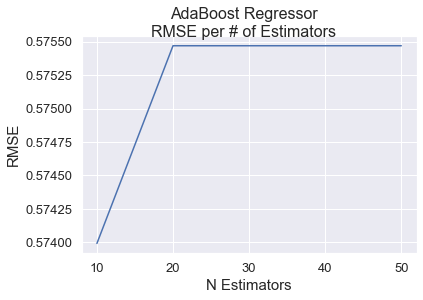

In [ ]:
ada_results_df = (
    pd.DataFrame(ada_results_optimize.items(), columns=["n_estimators", "RMSE"])
    .sort_values("n_estimators")
    .reset_index(drop=True)
)
ax = sns.lineplot(x="n_estimators", y="RMSE", data=ada_results_df)
plt.suptitle("AdaBoost Regressor\nRMSE per # of Estimators", fontsize=16)
ax.set_xlabel("N Estimators", fontsize=15)
ax.set_ylabel("RMSE", fontsize=15)
ax.xaxis.set_tick_params(labelsize=13)
ax.yaxis.set_tick_params(labelsize=13)

In [ ]:
ada_results_df.sort_values("RMSE").head(1)

,n_estimators,RMSE
0,10,0.573992


In [ ]:
model_results["Ada Boost"] = ada_results_df.sort_values("RMSE").head(1).iloc[0]["RMSE"]
model_results["Ada Boost"]

0.5739919178750359

In [ ]:
ada_reg = AdaBoostRegressor(
        base_estimator=DecisionTreeRegressor(max_depth=3, random_state=42),
        n_estimators=10,
        random_state=42,
        loss="linear",
    )
ada_reg.fit(X_train, y_train)

AdaBoostRegressor(base_estimator=DecisionTreeRegressor(max_depth=3,
                                                       random_state=42),
                  n_estimators=10, random_state=42)

In [ ]:
predictions = roundPred(ada_reg.predict(X_test))
ada_rmse = rmse(y_test, predictions)
ada_rmse

0.5709426670870983

In [ ]:
model_results["AdaBoost"] = ada_rmse

### d) Support Vector Machines

#### 1. Linear SVR

In [ ]:
lin_svr = LinearSVR(random_state=42)
lin_svr.fit(X_train, y_train)

LinearSVR(random_state=42)

In [ ]:
predictions = roundPred(lin_svr.predict(X_dev))
lin_svr_rmse = rmse(y_dev, predictions)

In [ ]:
lin_svr_rmse

0.5657183092819256

In [ ]:
predictions = roundPred(lin_svr.predict(X_test))
lin_svr_rmse = rmse(y_test, predictions)

In [ ]:
lin_svr_rmse

0.5767342147795244

In [ ]:
model_results["Linear SVR"] = lin_svr_rmse

In [ ]:
for c in range(1, 21, 1):
    c = c / 10
    svr = LinearSVR(C=c)
    svr.fit(X_train, y_train)
    preds = roundPred(svr.predict(X_dev))

    RMSE = rmse(dev_df["meanGrade"], preds)
    print(c, RMSE)

0.1 0.5577556454811937
0.2 0.5594023267809468
0.3 0.5615781224354996
0.4 0.562769387976099
0.5 0.5632980306656489
0.6 0.5621336251146143
0.7 0.5634117708042469
0.8 0.563496143813425
0.9 0.5651297560508018
1.0 0.565499044276939
1.1 0.5662076945513552
1.2 0.5661164234307717
1.3 0.5670138922730122
1.4 0.5668315949630606
1.5 0.566769600520715
1.6 0.5679499771275837
1.7 0.5680045647826168
1.8 0.5672507911915879
1.9 0.5674766641593646
2.0 0.5673200198835994


In [ ]:
lin_svr = LinearSVR(random_state=42, C=0.1)
lin_svr.fit(X_train, y_train)

LinearSVR(C=0.1, random_state=42)

In [ ]:
predictions = roundPred(lin_svr.predict(X_test))
lin_svr = rmse(y_test, predictions)
lin_svr

0.5655948079433604

#### 2. NuSVR

In [ ]:
nu_svr = NuSVR()
nu_svr.fit(X_train, y_train)

NuSVR()

In [ ]:
predictions = roundPred(nu_svr.predict(X_dev))
nu_svr_rmse = rmse(y_dev, predictions)

In [ ]:
nu_svr_rmse

0.5485107048961729

In [ ]:
predictions = roundPred(nu_svr.predict(X_test))
nu_svr_rmse = rmse(y_test, predictions)
nu_svr_rmse

0.557995633481237

In [ ]:
model_results["NuSVR"] = nu_svr_rmse

In [ ]:
'''
#Loading data back because kernel was interrupted.

#Train data
X_train = pd.read_csv("X_train_word2vec.csv", dtype=str, header=None)
#Validation data
X_dev = pd.read_csv("X_dev_word2vec.csv", dtype=str, header=None)
#Test data
X_test = pd.read_csv("X_test_word2vec.csv", dtype=str, header=None)
'''

In [ ]:
X_train.shape

(9652, 600)

In [ ]:
X_train

,0,1,2,3,4,5,6,7,8,9,...,590,591,592,593,594,595,596,597,598,599
0,0.005340576171875,0.0568084716796875,-0.029781341552734375,0.10391998291015625,-0.07248783111572266,0.010456085205078125,-0.040187835693359375,-0.132568359375,0.0050048828125,0.07699966430664062,...,-0.024853229522705078,0.018535614013671875,-0.069488525390625,0.062042236328125,-0.0904388427734375,0.0114898681640625,-0.070068359375,-0.1090087890625,0.1029815673828125,0.0858612060546875
1,-0.03814697265625,0.0205078125,0.0229949951171875,0.2088479995727539,-0.03173828125,0.0528106689453125,-0.037933349609375,-0.1496429443359375,0.0374908447265625,0.099761962890625,...,0.011827230453491211,0.03704833984375,-0.0001678466796875,0.02557373046875,-0.0130462646484375,-0.03253173828125,-0.0465087890625,0.00623321533203125,-0.06876850128173828,0.0384368896484375
2,0.0469156913459301,-0.0207858607172966,-0.06201171875,0.00469292514026165,-0.0621744804084301,-0.0679677352309227,-0.0862087681889534,-0.1019558385014534,0.1430121511220932,0.1147596538066864,...,0.0398491770029068,0.01930745504796505,-0.0817667618393898,0.02718099020421505,0.0463595911860466,0.0365125872194767,-0.0745985209941864,-0.1059163436293602,0.00852288119494915,0.006561279296875
3,-0.0050455727614462376,0.0152587890625,-0.0038859050255268812,0.2582193911075592,-0.1008707657456398,-0.011835734359920025,-0.0060628256760537624,-0.13232421875,0.0911051407456398,0.0485941581428051,...,-0.0753580704331398,0.0991617813706398,-0.02685546875,0.064727783203125,-0.0635579451918602,-0.0526936836540699,-0.1554412841796875,-0.07358551025390625,0.022216796875,0.06353759765625
4,-0.0485927052795887,0.0385502390563488,0.0489501953125,-0.0938720703125,-0.1269182413816452,-0.0342494435608387,0.1143362894654274,-0.0357666015625,0.1103515625,0.0741838738322258,...,0.0312761589884758,-0.012660435400903225,-0.1211635023355484,0.0416434146463871,-0.0006452287780120969,-0.1052507683634758,-0.01164899580180645,-0.0577828548848629,0.0805315300822258,0.0540597103536129
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9647,-0.01357184536755085,0.0214402936398983,-0.02498372457921505,0.0314127616584301,-0.0082872174680233,-0.1113552525639534,-0.0374077707529068,-0.0798577219247818,0.058040618896484375,-0.0098741315305233,...,-0.1329752653837204,-5.425347262644209e-05,-0.0110079450532794,-0.014194064773619175,0.0004035102028865367,0.02541097067296505,-0.02759806253015995,-0.0818413645029068,-0.1007283553481102,-0.004638671875
9648,0.0529632568359375,0.0637054443359375,0.1473236083984375,0.06842041015625,-0.051422119140625,-0.178314208984375,-0.1476287841796875,-0.01657867431640625,0.0060272216796875,0.0651397705078125,...,0.1115570068359375,-0.10003662109375,0.0341796875,-0.090576171875,0.082000732421875,0.04876708984375,-0.0857086181640625,-0.13046550750732422,0.050891876220703125,0.0386199951171875
9649,0.01059875451028347,0.06308593600988388,-0.04315795749425888,0.05209960788488388,-0.07177734375,-0.0633544921875,-0.05830078199505806,-0.09479065239429474,-0.0037109374534338713,0.0396728515625,...,0.064056396484375,-0.02286376990377903,-0.11668357998132706,0.03936767578125,0.03031005896627903,0.0027221678756177425,0.02595214918255806,-0.012744140811264515,-0.015499877743422985,0.01076660118997097
9650,-0.01394042931497097,0.0035644532181322575,0.07424316555261612,0.09614257514476776,0.01055908203125,-0.04620361328125,-0.04680175706744194,-0.09706421196460724,-0.01165771484375,0.09182129055261612,...,-0.10948486626148224,0.00250244140625,-0.13474731147289276,0.121826171875,0.049652099609375,-0.07924804836511612,-0.03114013746380806,-0.08006896823644638,0.034759521484375,-0.00189208984375


#### 3. RBF-Kernel SVR

In [ ]:
svr = SVR()
svr.fit(X_train, y_train)

SVR()

In [ ]:
predictions = roundPred(svr.predict(X_dev))
svr_rmse = rmse(y_dev, predictions)

In [ ]:
svr_rmse

0.5492111671839622

In [ ]:
predictions = roundPred(svr.predict(X_test))
svr_rmse = rmse(y_test, predictions)

In [ ]:
svr_rmse

0.5585553929415837

In [ ]:
model_results["SVR"] = svr_rmse

#### Tuning SVM Models

In [ ]:
for svm in [LinearSVR, NuSVR, SVR]:
    print(svm)
    svm = svm()
    svm.fit(X_train, y_train)
    preds = roundPred(svm.predict(X_dev))
    RMSE = rmse(y_dev, preds)
    print(RMSE, "\n")

<class 'sklearn.svm._classes.LinearSVR'>
0.5655904150259652 

<class 'sklearn.svm._classes.NuSVR'>
0.5485107048961729 

<class 'sklearn.svm._classes.SVR'>
0.5492111671839622 



In [ ]:
svr_kernel = {}
for kernel in ["linear", "poly", "rbf", "sigmoid"]:
    svr = SVR(kernel=kernel)
    svr.fit(X_train, y_train)
    preds = roundPred(svr.predict(X_dev))
    
    RMSE = rmse(y_dev, preds)
    svr_kernel[kernel] = RMSE
    print(f"{kernel}: {RMSE:.5f}")

linear: 0.56021
poly: 0.56498
rbf: 0.54921
sigmoid: 5.64171


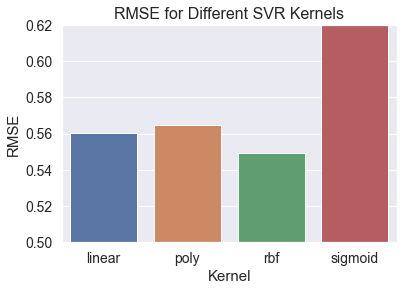

In [ ]:
ax = sns.barplot(x=list(svr_kernel.keys()), y=list(svr_kernel.values()))
plt.ylim(.5,.62);
ax.xaxis.set_tick_params(labelsize=14)
ax.yaxis.set_tick_params(labelsize=14)
ax.set_xlabel('Kernel', fontsize=15);
ax.set_ylabel('RMSE', fontsize=15);
ax.set_title("RMSE for Different SVR Kernels", fontsize=16);

**The best kernel is "RBF". Now we will tune the 'C' parameter.**

In [ ]:
svr_rbf_c_results = {}

In [ ]:
for c in range(2, 41, 2):
    c = c / 10
    svr = SVR(kernel="rbf",C=c)
    svr.fit(X_train, y_train)
    preds = roundPred(svr.predict(X_dev))

    RMSE = rmse(y_dev, preds)
    svr_rbf_c_results[c] = RMSE
    print(c, RMSE)

0.2 0.5500234877919106
0.4 0.5490756635768597
0.6 0.5487744246599054
0.8 0.5482430881196209
1.0 0.5492111671839622
1.2 0.5509396685627487
1.4 0.5520041279329929
1.6 0.552367223322111
1.8 0.5540821488709013
2.0 0.555795501901425
2.2 0.5570102675872343
2.4 0.5574108930396017
2.6 0.5582964403023158
2.8 0.5593358135273805
3.0 0.5605834673749942
3.2 0.5606461458604057
3.4 0.5628795628127987
3.6 0.5643172038605274
3.8 0.5650017285694637
4.0 0.5659557505085461


In [ ]:
sorted(svr_rbf_c_results.items(), key=lambda x: x[1])[0]

(0.8, 0.5482430881196209)

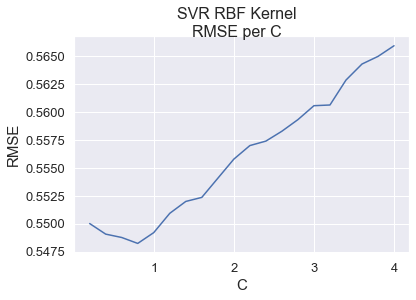

In [ ]:
svr_rbf_c_results_df = (
    pd.DataFrame(svr_rbf_c_results.items(), columns=["C", "RMSE"])
    .sort_values("C")
    .reset_index(drop=True)
)
ax = sns.lineplot(x="C", y="RMSE", data=svr_rbf_c_results_df, color="b")
plt.suptitle("SVR RBF Kernel\nRMSE per C", fontsize=16)
ax.set_xlabel("C", fontsize=15)
ax.set_ylabel("RMSE", fontsize=15)
ax.xaxis.set_tick_params(labelsize=13)
ax.yaxis.set_tick_params(labelsize=13)

#### SVM Model with best hyperparameters:

In [ ]:
SVR_RBF = SVR(kernel="rbf", C=0.8)
SVR_RBF.fit(X_train, y_train)
predictions = roundPred(SVR_RBF.predict(X_dev))

SVR_RBF_RMSE = rmse(y_dev, predictions)

In [ ]:
predictions = roundPred(SVR_RBF.predict(X_test))

SVR_RBF_RMSE = rmse(y_test, predictions)
print(f"SVR_RBF: {SVR_RBF_RMSE:.5f}")

SVR_RBF: 0.55829


In [ ]:
model_results["SVR_RBF"] = SVR_RBF_RMSE

| Parameter | Value   |
|-----------|---------|
| Model     | SVR     |
| Kernel    | rbf     |
| C         | 0.8     |
| Epsilon   | 0.1     |
| RMSE      | 0.55829 |

### e) XGBoost Model

In [ ]:
import xgboost as xgb

In [ ]:
xgb_reg = xgb.XGBRegressor()
xgb_reg.fit(X_train, y_train)

In [ ]:
predictions = roundPred(xgb_reg.predict(X_dev))
xgb_reg_rmse = rmse(y_dev, predictions)

In [ ]:
xgb_reg_rmse

0.564924898153682

In [ ]:
predictions = roundPred(xgb_reg.predict(X_test))
xgb_reg_rmse = rmse(y_test, predictions)

In [ ]:
xgb_reg_rmse

0.5622375931144333

### f) Stacking Regressor Model

In [ ]:
from sklearn.ensemble import StackingRegressor

level0 = list()
level0.append(('rbf-svr',SVR(kernel="rbf", C=0.8)))
level0.append(('nu-svr', NuSVR()))
level0.append(('linear-svr', LinearSVR()))
level1 = LinearRegression()
model = StackingRegressor(estimators=level0, final_estimator=level1, cv=5)
model.fit(X_train, y_train)

StackingRegressor(cv=5,
                  estimators=[('rbf-svr', SVR(C=0.8)), ('nu-svr', NuSVR()),
                              ('linear-svr', LinearSVR())],
                  final_estimator=LinearRegression())

In [ ]:
predictions = roundPred(model.predict(X_test))
stacking_reg_rmse = rmse(y_test, predictions)

In [ ]:
stacking_reg_rmse

0.5503546235294219

In [ ]:
def preds_to_csv(df, predictions, file_name="gdrive/My Drive/word2vec-output.csv"):
    final_df = pd.DataFrame(df["id"])
    final_df["pred"] = predictions
    final_df.to_csv(file_name, index=False)
    return f"Final Predictions saved to: {file_name}"

In [ ]:
preds_to_csv(test_df, predictions)

'Final Predictions saved to: gdrive/My Drive/word2vec-output.csv'

## Conclusion: 

**Stacking Regression Model is the best performing model with RMSE as 0.5503**

